link - https://github.com/AlexeyAB/darknet#how-to-train-to-detect-your-custom-objects

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector valid build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_2000.weights

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
results: Using default 'results'
 0 : compute_capability = 610, cudnn_half = 0, GPU: Tesla P4 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   3 route  1 		                           ->  208 x 208 x  64 
   4 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   5 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   6 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   8 conv     64       1 x

In [ ]:
# define helper functions
def imShow(path):
  import cv2
  import matplotlib.pyplot as plt
  %matplotlib inline

  image = cv2.imread(path)
  height, width = image.shape[:2]
  resized_image = cv2.resize(image,(3*width, 3*height), interpolation = cv2.INTER_CUBIC)

  fig = plt.gcf()
  fig.set_size_inches(18, 10)
  plt.axis("off")
  plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
  plt.show()

# use this to upload files
def upload():
  from google.colab import files
  uploaded = files.upload() 
  for name, data in uploaded.items():
    with open(name, 'wb') as f:
      f.write(data)
      print ('saved file', name)

# use this to download a file  
def download(path):
  from google.colab import files
  files.download(path)

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_2000.weights ../1-200102094256105.png -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 600, cudnn_half = 0, GPU: Tesla P100-PCIE-16GB 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   3 route  1 		                           ->  208 x 208 x  64 
   4 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   5 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   6 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   8 conv     64       1 x 1/ 1    208 x 208 x 

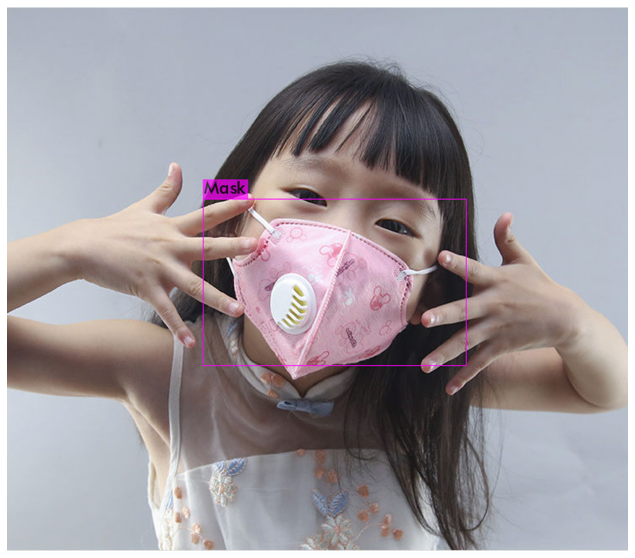

In [ ]:
imShow('drive/My Drive/Face Mask Detection/darknet/predictions.jpg')

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_2000.weights ../5db917bb89170.jpg -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 600, cudnn_half = 0, GPU: Tesla P100-PCIE-16GB 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   3 route  1 		                           ->  208 x 208 x  64 
   4 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   5 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   6 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   8 conv     64       1 x 1/ 1    208 x 208 x 

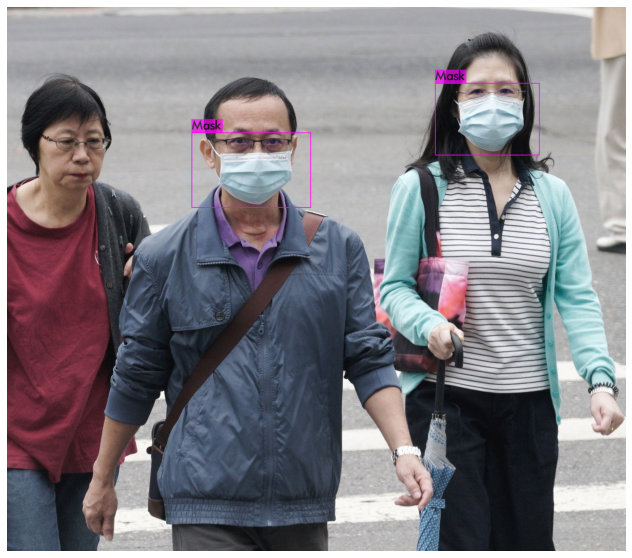

In [ ]:
imShow('drive/My Drive/Face Mask Detection/darknet/predictions.jpg')

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_3000.weights ../5db917bb89170.jpg -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 600, cudnn_half = 0, GPU: Tesla P100-PCIE-16GB 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   3 route  1 		                           ->  208 x 208 x  64 
   4 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   5 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   6 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   8 conv     64       1 x 1/ 1    208 x 208 x 

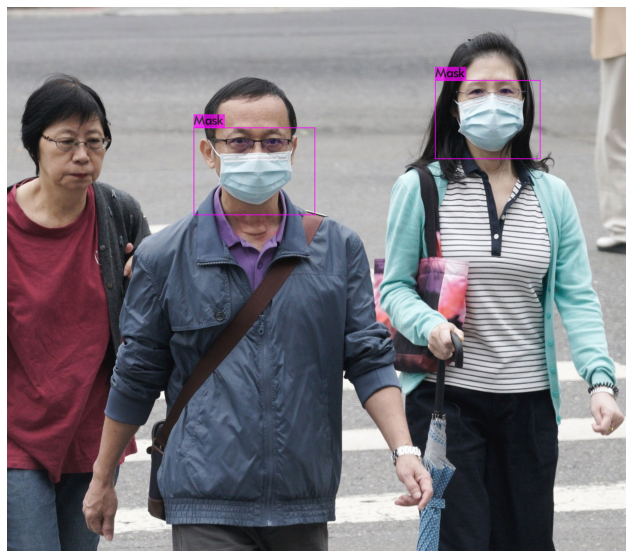

In [ ]:
imShow('drive/My Drive/Face Mask Detection/darknet/predictions.jpg')

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_3000.weights ../3061836_4_1.jpg -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 600, cudnn_half = 0, GPU: Tesla P100-PCIE-16GB 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   3 route  1 		                           ->  208 x 208 x  64 
   4 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   5 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   6 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   8 conv     64       1 x 1/ 1    208 x 208 x 

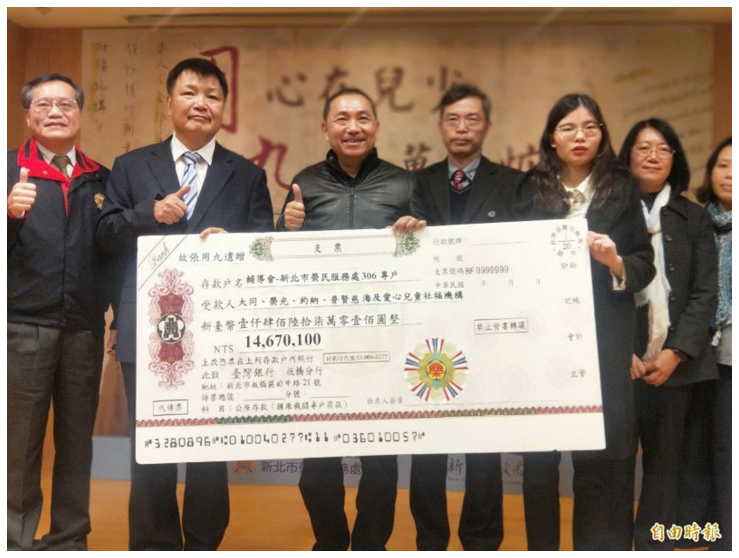

In [ ]:
imShow('drive/My Drive/Face Mask Detection/darknet/predictions.jpg')

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_3000.weights ../0_0_baobeier_0020.jpg -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 600, cudnn_half = 0, GPU: Tesla P100-PCIE-16GB 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   3 route  1 		                           ->  208 x 208 x  64 
   4 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   5 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   6 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   8 conv     64       1 x 1/ 1    208 x 208 x 

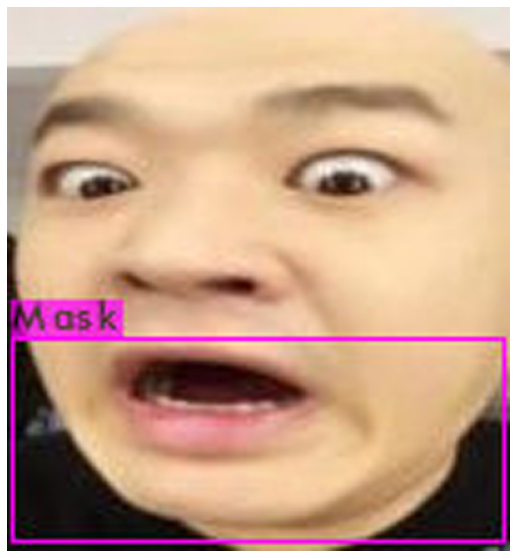

In [ ]:
imShow('drive/My Drive/Face Mask Detection/darknet/predictions.jpg')

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_3000.weights ../1-200102094256105.png -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 600, cudnn_half = 0, GPU: Tesla P100-PCIE-16GB 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   3 route  1 		                           ->  208 x 208 x  64 
   4 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   5 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   6 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   8 conv     64       1 x 1/ 1    208 x 208 x 

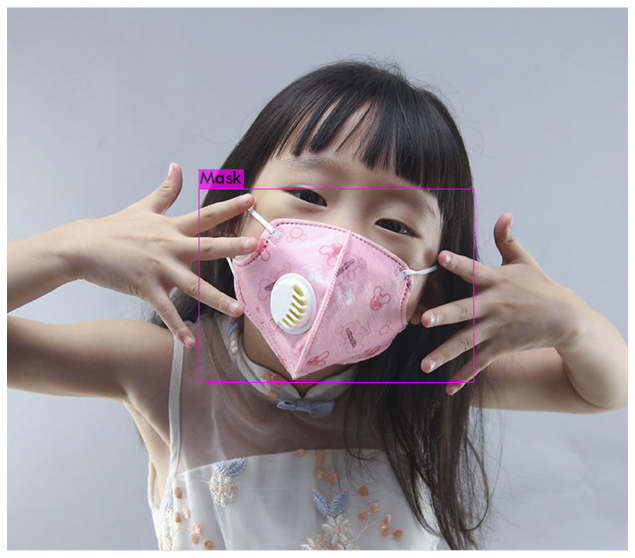

In [ ]:
imShow('drive/My Drive/Face Mask Detection/darknet/predictions.jpg')

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_4000.weights ../0_0_baobeier_0020.jpg -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 600, cudnn_half = 0, GPU: Tesla P100-PCIE-16GB 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   3 route  1 		                           ->  208 x 208 x  64 
   4 conv     64       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  64 0.354 BF
   5 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   6 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   8 conv     64       1 x 1/ 1    208 x 208 x 

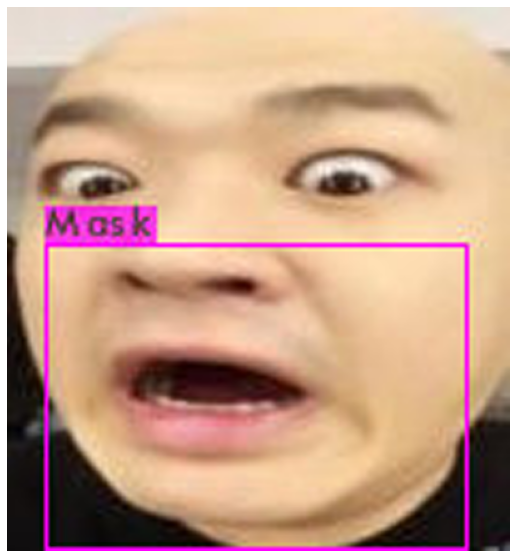

In [ ]:
imShow('drive/My Drive/Face Mask Detection/darknet/predictions.jpg')

In [ ]:
# test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_4000.weights ../0_0_baobeier_0020.jpg -dont_show
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector demo build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_4000.weights test50.mp4 -i 0 -thresh 0.25

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0


KeyboardInterrupt: ignored

#After Trial-2

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_2000.weights ../5db917bb89170.jpg -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 600, cudnn_half = 0, GPU: Tesla P100-PCIE-16GB 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x 

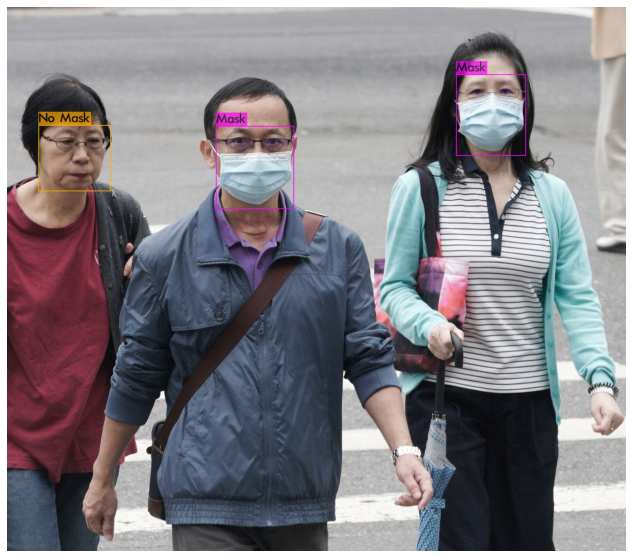

In [ ]:
imShow('drive/My Drive/Face Mask Detection/darknet/predictions.jpg')

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_3000.weights ../3061836_4_1.jpg -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 600, cudnn_half = 0, GPU: Tesla P100-PCIE-16GB 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x 

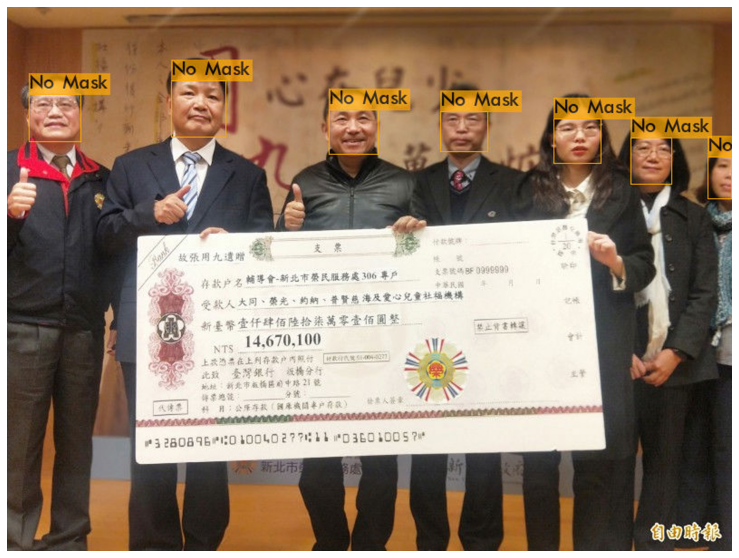

In [ ]:
imShow('drive/My Drive/Face Mask Detection/darknet/predictions.jpg')

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights ../3061836_4_1.jpg -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 600, cudnn_half = 0, GPU: Tesla P100-PCIE-16GB 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x 

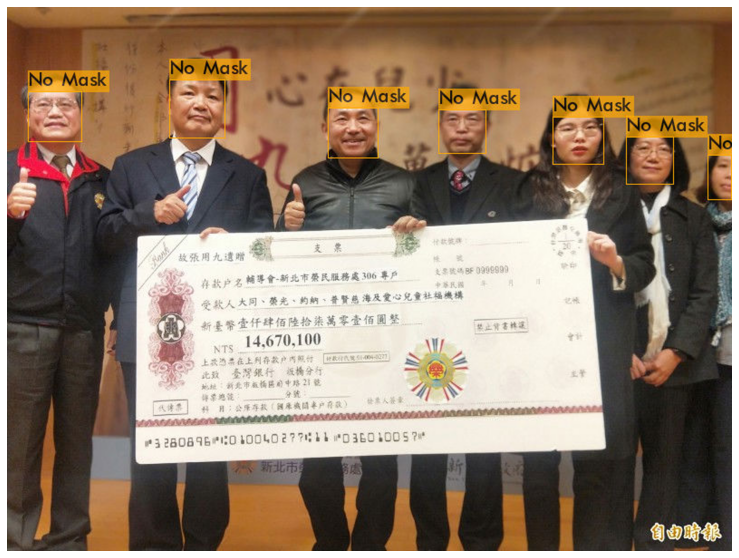

In [ ]:
imShow('drive/My Drive/Face Mask Detection/darknet/predictions.jpg')

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights ../0_0_baobeier_0020.jpg -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 600, cudnn_half = 0, GPU: Tesla P100-PCIE-16GB 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x 

In [ ]:
!mv 'drive/My Drive/Face Mask Detection/darknet/predictions.jpg'  'drive/My Drive/Face Mask Detection/darknet/predictions_0_0_baobeier_0020.jpg'

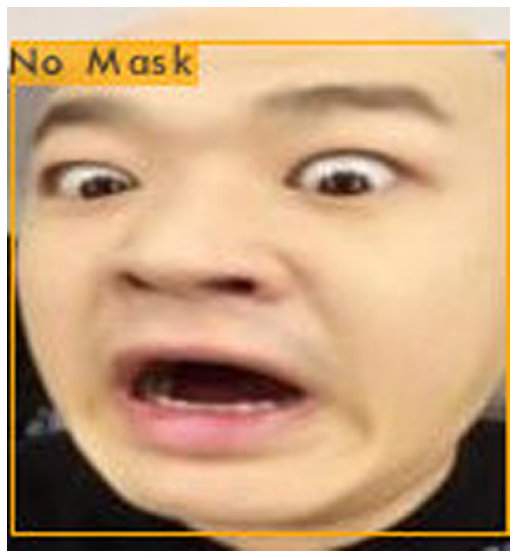

In [ ]:
imShow('drive/My Drive/Face Mask Detection/darknet/predictions_0_0_baobeier_0020.jpg')

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights ../maksssksksss11.png -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 600, cudnn_half = 0, GPU: Tesla P100-PCIE-16GB 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x 

In [ ]:
mv 'drive/My Drive/Face Mask Detection/darknet/predictions.jpg'  'drive/My Drive/Face Mask Detection/darknet/predictions_maksssksksss11.jpg'

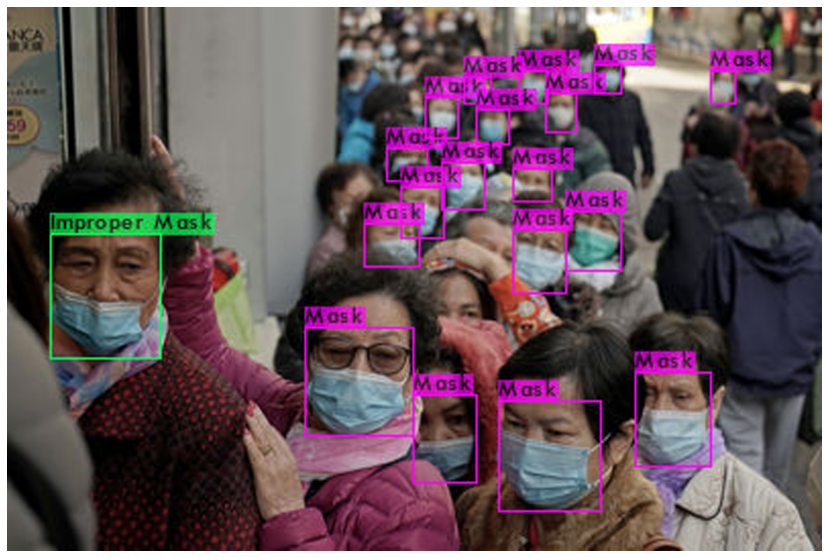

In [ ]:
imShow('drive/My Drive/Face Mask Detection/darknet/predictions_maksssksksss11.jpg')

In [ ]:
# Web cam not working
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
./darknet detector demo build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights -c 0 -dont_show

Streaming output truncated to the last 5000 lines.
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream stopped! 
 Video-stream

KeyboardInterrupt: ignored

In [ ]:
! mv 'drive/My Drive/Face Mask Detection/darknet/predictions.jpg'  'drive/My Drive/Face Mask Detection/darknet/predictions_maksssksksss211.jpg'

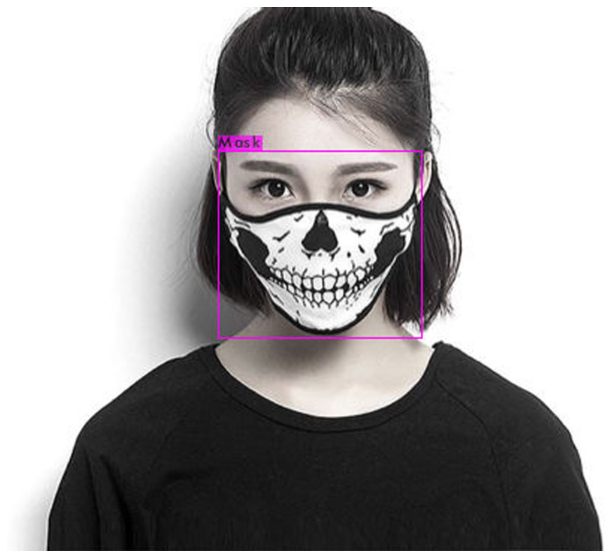

In [ ]:
imShow('drive/My Drive/Face Mask Detection/darknet/predictions_maksssksksss211.jpg')

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights ../test_image.jfif -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 610, cudnn_half = 0, GPU: Tesla P4 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 

In [ ]:
! mv 'drive/My Drive/Face Mask Detection/darknet/predictions.jpg'  'drive/My Drive/Face Mask Detection/darknet/predictions_test_image.jpg'

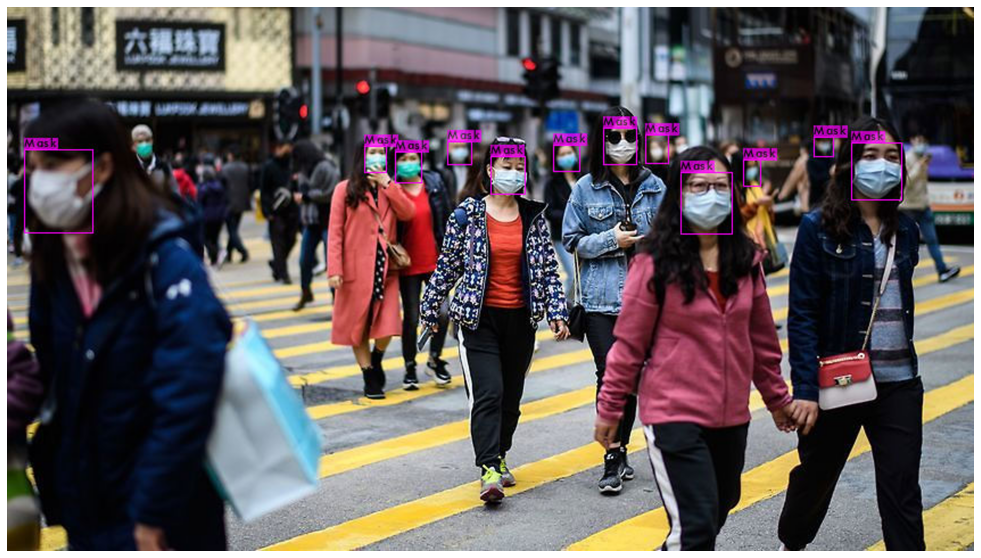

In [ ]:
imShow('drive/My Drive/Face Mask Detection/darknet/predictions_test_image.jpg')

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector map build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 610, cudnn_half = 0, GPU: Tesla P4 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector map build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights -dont_show -points 0

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 610, cudnn_half = 0, GPU: Tesla P4 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector map build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights -dont_show -iou_thresh 0.75 -points 0

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 610, cudnn_half = 0, GPU: Tesla P4 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 

In [ ]:
# Yolo v4 - save result videofile res.avi: darknet.exe detector demo cfg/coco.data cfg/yolov4.cfg yolov4.weights test.mp4 -out_filename res.avi
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector demo build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights ../Supermarket_video.mp4 -out_filename Supermarket_mask_predictions.mp4 -dont_show

Streaming output truncated to the last 5000 lines.
Objects:

No Mask: 35% 

FPS:28.2 	 AVG_FPS:26.6

 cvWriteFrame 
Objects:

No Mask: 27% 

FPS:28.2 	 AVG_FPS:27.6

 cvWriteFrame 
Objects:


FPS:28.2 	 AVG_FPS:27.6

 cvWriteFrame 
Objects:


FPS:28.2 	 AVG_FPS:27.6

 cvWriteFrame 
Objects:


FPS:28.2 	 AVG_FPS:27.6

 cvWriteFrame 
Objects:


FPS:28.3 	 AVG_FPS:27.6

 cvWriteFrame 
Objects:


FPS:28.4 	 AVG_FPS:27.6

 cvWriteFrame 
Objects:


FPS:28.4 	 AVG_FPS:27.6

 cvWriteFrame 
Objects:


FPS:28.4 	 AVG_FPS:27.6

 cvWriteFrame 
Objects:


FPS:28.2 	 AVG_FPS:27.6

 cvWriteFrame 
Objects:


FPS:27.9 	 AVG_FPS:27.6

 cvWriteFrame 
Objects:


FPS:28.0 	 AVG_FPS:27.6

 cvWriteFrame 
Objects:


FPS:27.4 	 AVG_FPS:27.6

 cvWriteFrame 
Objects:

Mask: 28% 

FPS:27.5 	 AVG_FPS:27.6

 cvWriteFrame 
Objects:

No Mask: 44% 
Mask: 30% 

FPS:27.3 	 AVG_FPS:27.6

 cvWriteFrame 
Objects:

No Mask: 95% 
No Mask: 57% 
No Mask: 27% 

FPS:27.5 	 AVG_FPS:27.6

 cvWriteFrame 
Objects:

No Mask: 98% 
No 

In [ ]:
! cp 'drive/My Drive/Face Mask Detection/darknet/Supermarket_mask_predictions.mp4'  'drive/My Drive/Face Mask Detection/darknet/results/Supermarket_mask_predictions.mp4'

In [ ]:
%%shell

ls -l "drive/My Drive/Face Mask Detection/Team pics for FMD"

total 10474
-rw------- 1 root root 1405102 Jun 29 08:00 Gargi_with_improper_mask2.JPG
-rw------- 1 root root 1568550 Jun 29 08:00 Gargi_with_improper_mask.JPG
-rw------- 1 root root 1362742 Jun 29 08:00 Gargi_with_mask.JPG
-rw------- 1 root root 2069740 Jun 29 05:58 Govind_with_improper_mask.jpg
-rw------- 1 root root 1930232 Jun 29 05:58 Govind_with_mask.jpg
-rw------- 1 root root   12164 Jun 29 10:12 IMG-20200629-WA0022.jpg
-rw------- 1 root root  110007 Jun 29 10:12 IMG-20200629-WA0023.jpg
-rw------- 1 root root   37485 Jun 29 10:12 IMG-20200629-WA0025.jpg
-rw------- 1 root root   39965 Jun 29 10:12 IMG-20200629-WA0026.jpg
-rw------- 1 root root   66018 Jun 29 10:12 IMG-20200629-WA0027.jpg
-rw------- 1 root root   69989 Jun 29 10:12 IMG-20200629-WA0028.jpg
-rw------- 1 root root   73110 Jun 29 10:12 IMG-20200629-WA0029.jpg
-rw------- 1 root root   98361 Jun 29 10:12 IMG-20200629-WA0030.jpg
-rw------- 1 root root   71123 Jun 29 10:12 IMG-20200629-WA0031.jpg
-rw------- 1 root root   7

In [ ]:
ls -l "drive/My Drive/Face Mask Detection/Team pics for FMD" | cut -d " " -f 11 > "drive/My Drive/Face Mask Detection/Team_pics_list.txt"

In [ ]:
%%writefile predict_mask.sh
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights $1 -dont_show
mv "drive/My Drive/Face Mask Detection/darknet/predictions.jpg" "drive/My Drive/Face Mask Detection/darknet/results/prediction_"+$1

Overwriting predict_mask.sh


In [ ]:
!ls

drive  predict_mask.sh	sample_data


In [ ]:
with open("drive/My Drive/Face Mask Detection/Team_pics_list.txt", "r") as f:
  filenames = f.readlines()
  for filename in filenames:
    print("Processing ", filename)
    %%shell
    sh predict_mask.sh filename

SyntaxError: ignored

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights ../"Team pics for FMD"/IMG-20200629-WA0025.jpg -dont_show
mv "drive/My Drive/Face Mask Detection/darknet/predictions.jpg" "drive/My Drive/Face Mask Detection/darknet/results/prediction_IMG-20200629-WA0025.jpg"

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112

CalledProcessError: ignored

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights -ext_output -dont_show -out result.json < ../Team_pics_list.txt

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector demo build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights ../Airport_video.mp4 -out_filename Airport_mask_predictions.mp4 -dont_show

Streaming output truncated to the last 5000 lines.
Objects:

Mask: 100% 

FPS:26.6 	 AVG_FPS:27.0

 cvWriteFrame 
Objects:

Mask: 100% 

FPS:26.8 	 AVG_FPS:27.0

 cvWriteFrame 
Objects:

Mask: 100% 

FPS:26.6 	 AVG_FPS:27.0

 cvWriteFrame 
Objects:

Mask: 100% 

FPS:26.6 	 AVG_FPS:27.0

 cvWriteFrame 
Objects:

Mask: 100% 

FPS:26.5 	 AVG_FPS:27.0

 cvWriteFrame 
Objects:

Mask: 100% 

FPS:26.6 	 AVG_FPS:27.0

 cvWriteFrame 
Objects:

Mask: 100% 

FPS:26.4 	 AVG_FPS:27.0

 cvWriteFrame 
Objects:

Mask: 100% 

FPS:26.5 	 AVG_FPS:27.0

 cvWriteFrame 
Objects:

Mask: 100% 

FPS:26.2 	 AVG_FPS:27.0

 cvWriteFrame 
Objects:

Mask: 100% 

FPS:26.5 	 AVG_FPS:27.0

 cvWriteFrame 
Objects:

Mask: 100% 

FPS:26.3 	 AVG_FPS:27.0

 cvWriteFrame 
Objects:

Mask: 100% 

FPS:26.6 	 AVG_FPS:27.0

 cvWriteFrame 
Objects:

Mask: 100% 

FPS:26.5 	 AVG_FPS:27.0

 cvWriteFrame 
Objects:

Mask: 100% 

FPS:26.7 	 AVG_FPS:27.0

 cvWriteFrame 
Objects:

Mask: 100% 

FPS:26.6 	 AVG_FPS:27.0

 cvWriteFrame 
Obje

In [ ]:
! mv 'drive/My Drive/Face Mask Detection/darknet/Airport_mask_predictions.mp4'  'drive/My Drive/Face Mask Detection/darknet/results/Airport_mask_predictions.mp4'

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights ../"Team pics for FMD"/IMG-20200629-WA0037.jpg -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112

In [ ]:
! mv 'drive/My Drive/Face Mask Detection/darknet/predictions.jpg'  'drive/My Drive/Face Mask Detection/darknet/results/prediction_IMG-20200629-WA0037.jpg'

In [ ]:
imShow( 'drive/My Drive/Face Mask Detection/darknet/results/prediction_IMG-20200629-WA0037.jpg')

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights ../test_image_from_Vishal_Sir.jpg -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112

In [ ]:
# Yolo v4 - save result videofile res.avi: darknet.exe detector demo cfg/coco.data cfg/yolov4.cfg yolov4.weights test.mp4 -out_filename res.avi
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector demo build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights ../MaskVideo1080.mp4 -out_filename MaskVideo1080_predictions.mp4 -dont_show

Streaming output truncated to the last 5000 lines.
Objects:

No Mask: 100% 

FPS:26.1 	 AVG_FPS:25.0

 cvWriteFrame 
Objects:

No Mask: 100% 

FPS:26.1 	 AVG_FPS:25.0

 cvWriteFrame 
Objects:

No Mask: 100% 

FPS:26.1 	 AVG_FPS:25.0

 cvWriteFrame 
Objects:

No Mask: 100% 

FPS:25.7 	 AVG_FPS:25.0

 cvWriteFrame 
Objects:

No Mask: 100% 

FPS:25.8 	 AVG_FPS:25.0

 cvWriteFrame 
Objects:

No Mask: 100% 

FPS:25.8 	 AVG_FPS:25.0

 cvWriteFrame 
Objects:

No Mask: 100% 

FPS:25.9 	 AVG_FPS:25.0

 cvWriteFrame 
Objects:

No Mask: 100% 

FPS:26.0 	 AVG_FPS:25.0

 cvWriteFrame 
Objects:

No Mask: 100% 

FPS:26.0 	 AVG_FPS:25.0

 cvWriteFrame 
Objects:

No Mask: 100% 

FPS:26.1 	 AVG_FPS:25.0

 cvWriteFrame 
Objects:

No Mask: 100% 

FPS:26.1 	 AVG_FPS:25.0

 cvWriteFrame 
Objects:

No Mask: 100% 

FPS:26.1 	 AVG_FPS:25.0

 cvWriteFrame 
Objects:

No Mask: 100% 

FPS:26.2 	 AVG_FPS:25.0

 cvWriteFrame 
Objects:

No Mask: 100% 

FPS:26.2 	 AVG_FPS:25.0

 cvWriteFrame 
Objects:

No Mask: 99% 



In [ ]:
! mv 'drive/My Drive/Face Mask Detection/darknet/MaskVideo1080_predictions.mp4'  'drive/My Drive/Face Mask Detection/darknet/results/MaskVideo1080_predictions.mp4'

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights ../"Team pics for FMD"/Gargi_with_mask.JPG -dont_show -thresh 0.25

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights ../Nicolas-1.png -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights ../Nicolas-impropermask.png -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights ../source3-43.jpeg -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112

In [ ]:
! mv 'drive/My Drive/Face Mask Detection/darknet/predictions.jpg'  'drive/My Drive/Face Mask Detection/darknet/results/prediction_source3-43.jpg'

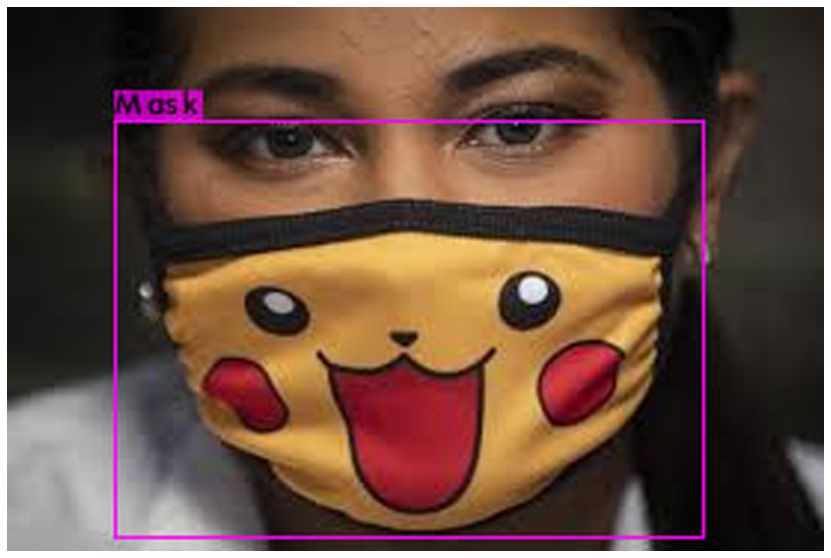

In [ ]:
imShow('drive/My Drive/Face Mask Detection/darknet/results/prediction_source3-43.jpg')

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights ../image_with_facepainted_mask.jfif -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112

In [ ]:
! mv 'drive/My Drive/Face Mask Detection/darknet/predictions.jpg'  'drive/My Drive/Face Mask Detection/darknet/results/prediction_image_with_facepainted_mask.jpg'

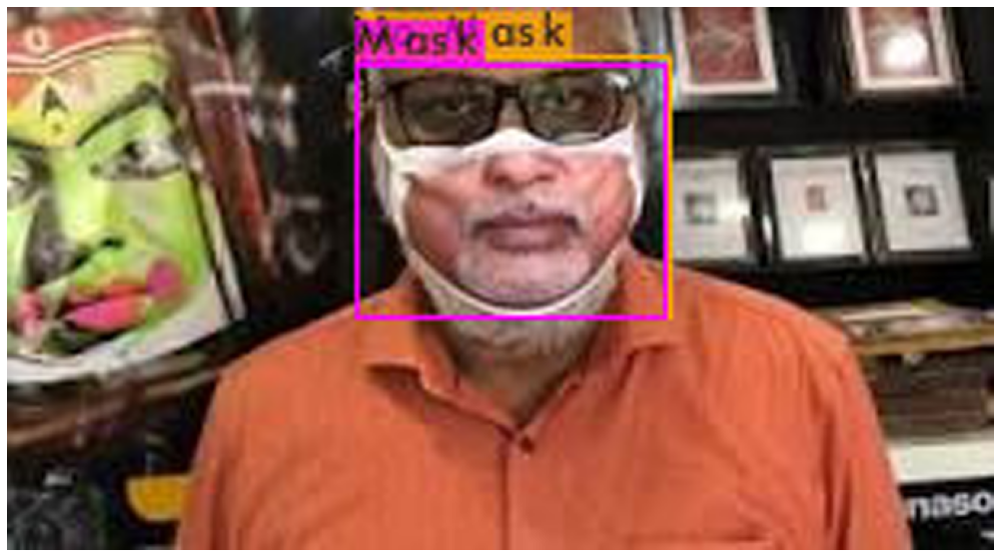

In [ ]:
imShow('drive/My Drive/Face Mask Detection/darknet/results/prediction_image_with_facepainted_mask.jpg')

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights ../image_with_facepainted_mask_2.jfif -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112

In [ ]:
! mv 'drive/My Drive/Face Mask Detection/darknet/predictions.jpg'  'drive/My Drive/Face Mask Detection/darknet/results/prediction_image_with_facepainted_mask_2.jpg'

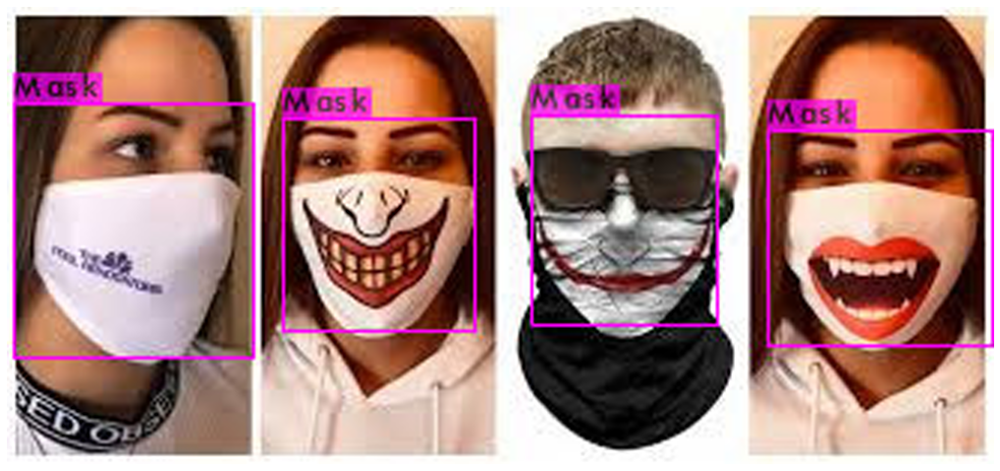

In [ ]:
imShow('drive/My Drive/Face Mask Detection/darknet/results/prediction_image_with_facepainted_mask_2.jpg')

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights ../image_with_facepainted_mask_3.jpg -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112

In [ ]:
mv 'drive/My Drive/Face Mask Detection/darknet/predictions.jpg'  'drive/My Drive/Face Mask Detection/darknet/results/incorrect_prediction_image_with_facepainted_mask_3.jpg'

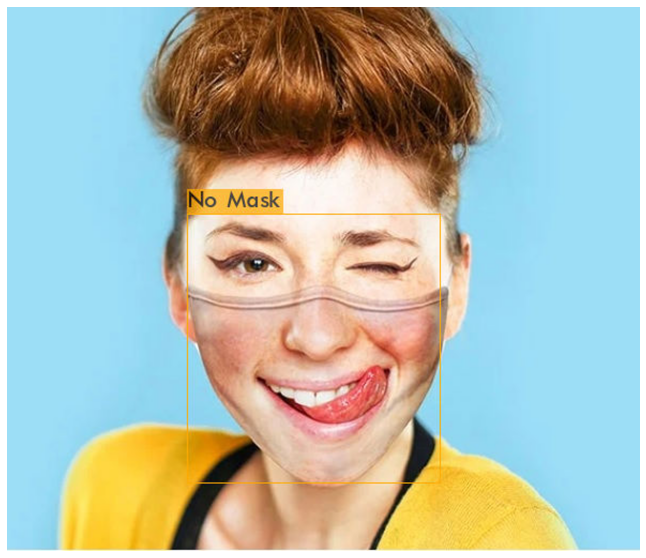

In [ ]:
imShow('drive/My Drive/Face Mask Detection/darknet/results/incorrect_prediction_image_with_facepainted_mask_3.jpg')

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights ../image_with_facepainted_mask_4.jpg -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112

In [ ]:
mv 'drive/My Drive/Face Mask Detection/darknet/predictions.jpg'  'drive/My Drive/Face Mask Detection/darknet/results/incorrect_prediction_image_with_facepainted_mask_4.jpg'

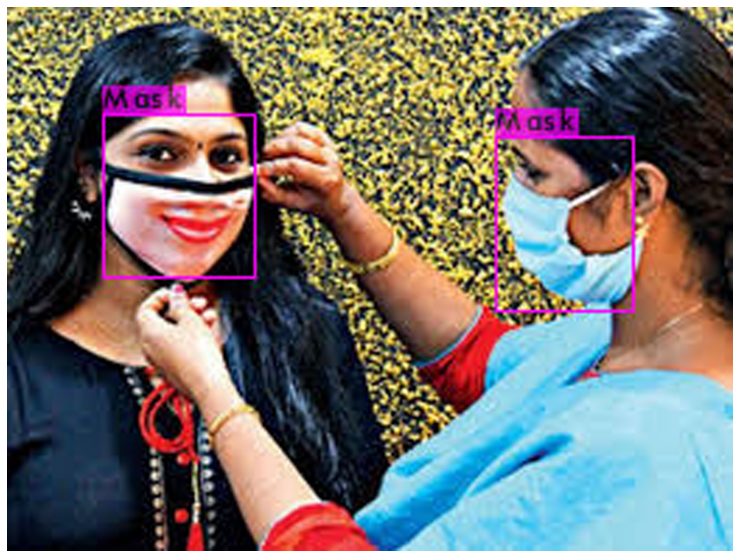

In [ ]:
imShow('drive/My Drive/Face Mask Detection/darknet/results/incorrect_prediction_image_with_facepainted_mask_4.jpg')

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights ../image_with_face_mask.jpg -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112

In [ ]:
mv 'drive/My Drive/Face Mask Detection/darknet/predictions.jpg'  'drive/My Drive/Face Mask Detection/darknet/results/prediction_image_with_facemask.jpg'

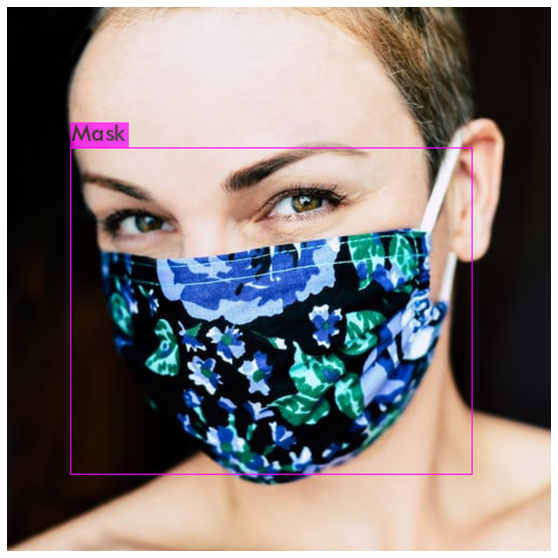

In [ ]:
imShow('drive/My Drive/Face Mask Detection/darknet/results/prediction_image_with_facemask.jpg')

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights ../source4-9.jpg -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112

In [ ]:
mv 'drive/My Drive/Face Mask Detection/darknet/predictions.jpg'  'drive/My Drive/Face Mask Detection/darknet/results/prediction_source4-9.jpg'

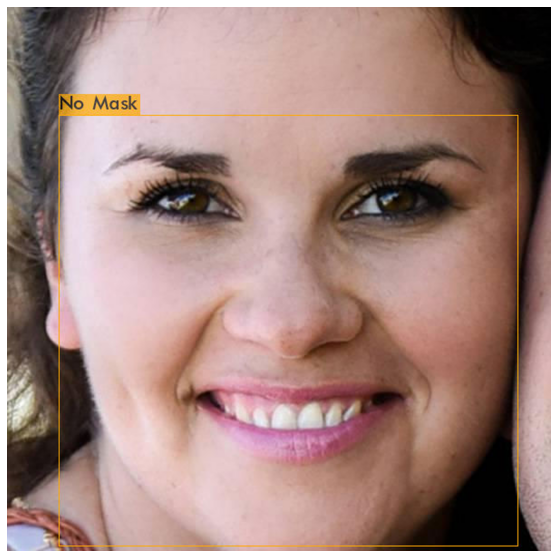

In [ ]:
imShow('drive/My Drive/Face Mask Detection/darknet/results/prediction_source4-9.jpg')

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights ../source2-125.jpeg -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 600, cudnn_half = 0, GPU: Tesla P100-PCIE-16GB 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x 

In [ ]:
mv 'drive/My Drive/Face Mask Detection/darknet/predictions.jpg'  'drive/My Drive/Face Mask Detection/darknet/results/prediction_source2-125.jpg'

In [ ]:
imShow('drive/My Drive/Face Mask Detection/darknet/results/prediction_source2-125.jpg')

NameError: ignored

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights ../thermal_image_with_face_mask.jpg -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 600, cudnn_half = 0, GPU: Tesla P100-PCIE-16GB 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x 

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights ../thermal_image_with_face_mask_bw.jpg -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 600, cudnn_half = 0, GPU: Tesla P100-PCIE-16GB 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x 

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights ../thermal_image_with_face_mask_1.jpg -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 600, cudnn_half = 0, GPU: Tesla P100-PCIE-16GB 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x 

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights ../thermal_image_with_face_mask_2.jpg -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 600, cudnn_half = 0, GPU: Tesla P100-PCIE-16GB 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x 

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights ../"Team pics for FMD"/Gargi_with_improper_mask2.JPG -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 750, cudnn_half = 1, GPU: Tesla T4 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights ../image_with_facepainted_mask_3.jpg -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112

In [ ]:
mv 'drive/My Drive/Face Mask Detection/darknet/predictions.jpg' 'drive/My Drive/Face Mask Detection/darknet/results/prediction_image_with_facepainted_mask_3.jpg'

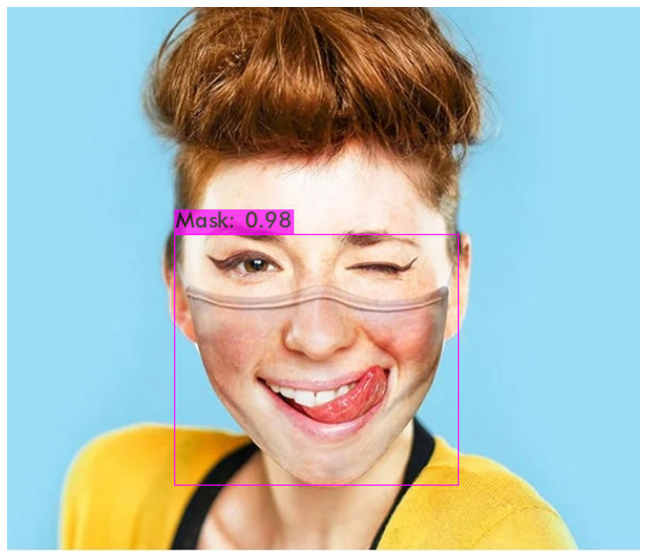

In [ ]:
imShow('drive/My Drive/Face Mask Detection/darknet/results/prediction_image_with_facepainted_mask_3.jpg')

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights ../test_image.jfif -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112

In [ ]:
! mv 'drive/My Drive/Face Mask Detection/darknet/predictions.jpg'  'drive/My Drive/Face Mask Detection/darknet/results/predictions_test_image.jpg'

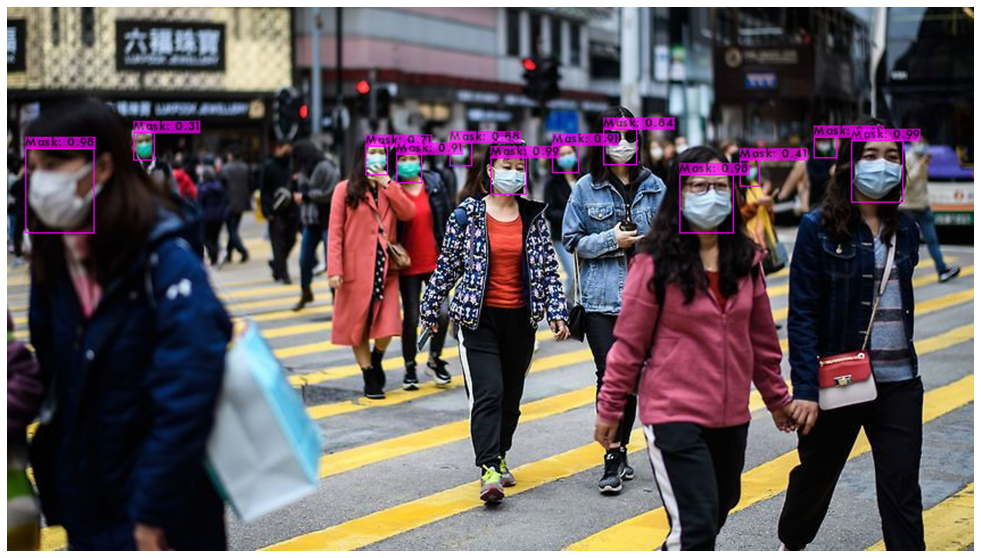

In [ ]:
imShow('drive/My Drive/Face Mask Detection/darknet/results/predictions_test_image.jpg')

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector demo build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights ../Airport_video.mp4 -out_filename Airport_mask_predictions.mp4 -dont_show

Streaming output truncated to the last 5000 lines.
FPS:26.0 	 AVG_FPS:26.6

 cvWriteFrame 
Objects:

Mask: 100% 

FPS:26.2 	 AVG_FPS:26.6

 cvWriteFrame 
Objects:

Mask: 100% 

FPS:26.1 	 AVG_FPS:26.6

 cvWriteFrame 
Objects:

Mask: 100% 

FPS:26.2 	 AVG_FPS:26.6

 cvWriteFrame 
Objects:

Mask: 99% 

FPS:26.2 	 AVG_FPS:26.6

 cvWriteFrame 
Objects:

Mask: 99% 

FPS:25.9 	 AVG_FPS:26.6

 cvWriteFrame 
Objects:

Mask: 99% 

FPS:25.9 	 AVG_FPS:26.6

 cvWriteFrame 
Objects:

Mask: 99% 

FPS:26.1 	 AVG_FPS:26.6

 cvWriteFrame 
Objects:

Mask: 99% 

FPS:26.0 	 AVG_FPS:26.6

 cvWriteFrame 
Objects:

Mask: 97% 

FPS:26.3 	 AVG_FPS:26.6

 cvWriteFrame 
Objects:

Mask: 94% 

FPS:26.3 	 AVG_FPS:26.6

 cvWriteFrame 
Objects:

Mask: 94% 

FPS:26.4 	 AVG_FPS:26.6

 cvWriteFrame 
Objects:

Mask: 96% 

FPS:26.4 	 AVG_FPS:26.6

 cvWriteFrame 
Objects:

Mask: 96% 

FPS:26.6 	 AVG_FPS:26.6

 cvWriteFrame 
Objects:

Mask: 96% 

FPS:26.5 	 AVG_FPS:26.6

 cvWriteFrame 
Objects:

Mask: 97% 

FPS:26.3 	 AVG_F

In [ ]:
! mv 'drive/My Drive/Face Mask Detection/darknet/Airport_mask_predictions.mp4'  'drive/My Drive/Face Mask Detection/darknet/results/Airport_mask_predictions.mp4'

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights ../"Team pics for FMD"/IMG-20200629-WA0040.jpg -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector map build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights -dont_show -iou_thresh 0.75 -points 0

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112

To process a list of images data/train.txt and save results of detection to result.txt use:
darknet.exe detector test cfg/coco.data cfg/yolov4.cfg yolov4.weights -dont_show -ext_output < data/train.txt > result.txt

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights -dont_show -ext_output < build/darknet/x64/data/test.txt > validation_set_predictions_result.txt

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   9 route  8 2 	                           ->  112 x 112 x 128 
  10 conv

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights ../image_with_facepainted_mask.jfif -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112

In [ ]:
! mv 'drive/My Drive/Face Mask Detection/darknet/predictions.jpg'  'drive/My Drive/Face Mask Detection/darknet/results/prediction_image_with_facepainted_mask.jpg'

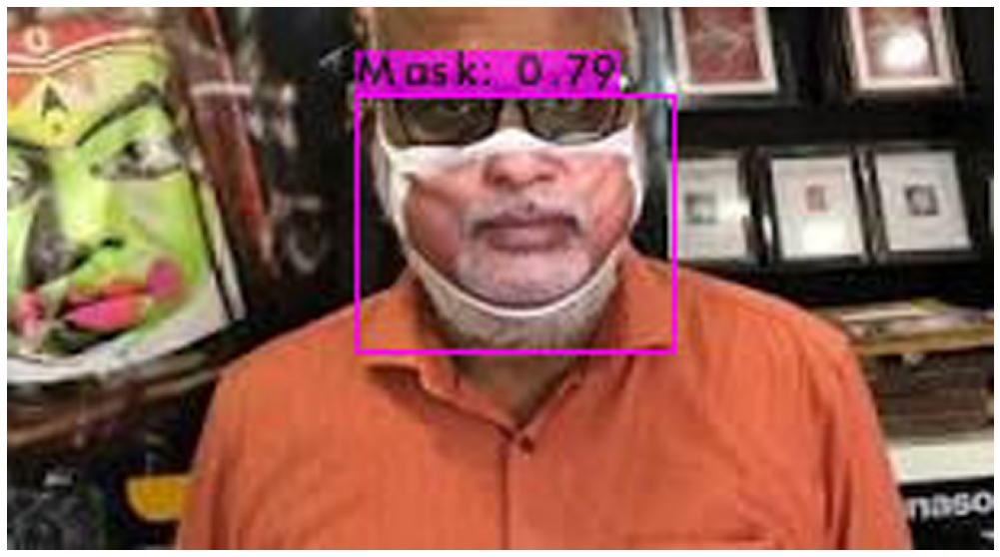

In [ ]:
imShow('drive/My Drive/Face Mask Detection/darknet/results/prediction_image_with_facepainted_mask.jpg')

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights ../river.jpg -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 600, cudnn_half = 0, GPU: Tesla P100-PCIE-16GB 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x 

In [ ]:
! mv 'drive/My Drive/Face Mask Detection/darknet/predictions.jpg' 'drive/My Drive/Face Mask Detection/darknet/results/prediction_river.jpg'

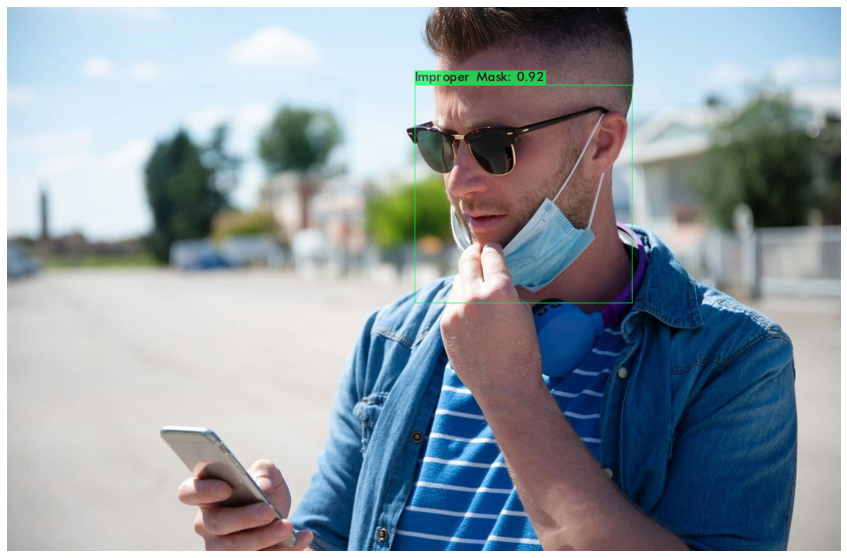

In [ ]:
imShow('drive/My Drive/Face Mask Detection/darknet/results/prediction_river.jpg')

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights ../Unbenannt1.PNG -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 600, cudnn_half = 0, GPU: Tesla P100-PCIE-16GB 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x 

In [ ]:
! mv 'drive/My Drive/Face Mask Detection/darknet/predictions.jpg' 'drive/My Drive/Face Mask Detection/darknet/results/prediction_Unbenannt1.png'

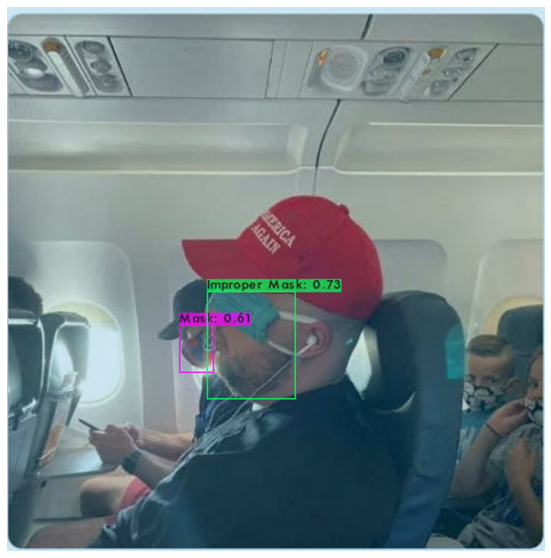

In [ ]:
imShow('drive/My Drive/Face Mask Detection/darknet/results/prediction_Unbenannt1.png')

In [ ]:
%%shell
cd "drive/My Drive/Face Mask Detection/darknet"
chmod +x darknet
./darknet detector test build/darknet/x64/data/obj.data cfg/yolov4-facemask.cfg backup/yolov4-facemask_final.weights ../maksssksksss11.png -dont_show

 CUDA-version: 10010 (10010), cuDNN: 7.6.5, CUDNN_HALF=1, GPU count: 1  
 CUDNN_HALF=1 
 OpenCV version: 3.2.0
 0 : compute_capability = 750, cudnn_half = 1, GPU: Tesla T4 
net.optimized_memory = 0 
mini_batch = 1, batch = 16, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 conv     32       3 x 3/ 1    224 x 224 x   3 ->  224 x 224 x  32 0.087 BF
   1 conv     64       3 x 3/ 2    224 x 224 x  32 ->  112 x 112 x  64 0.462 BF
   2 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   3 route  1 		                           ->  112 x 112 x  64 
   4 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  64 0.103 BF
   5 conv     32       1 x 1/ 1    112 x 112 x  64 ->  112 x 112 x  32 0.051 BF
   6 conv     64       3 x 3/ 1    112 x 112 x  32 ->  112 x 112 x  64 0.462 BF
   7 Shortcut Layer: 4,  wt = 0, wn = 0, outputs: 112 x 112 x  64 0.001 BF
   8 conv     64       1 x 1/ 1    112 x 112 x  64 ->  112 

In [ ]:
mv 'drive/My Drive/Face Mask Detection/darknet/predictions.jpg' 'drive/My Drive/Face Mask Detection/darknet/predictions_maksssksksss11.jpg'

mv: cannot stat 'drive/My Drive/Face Mask Detection/darknet/predictions.jpg': No such file or directory


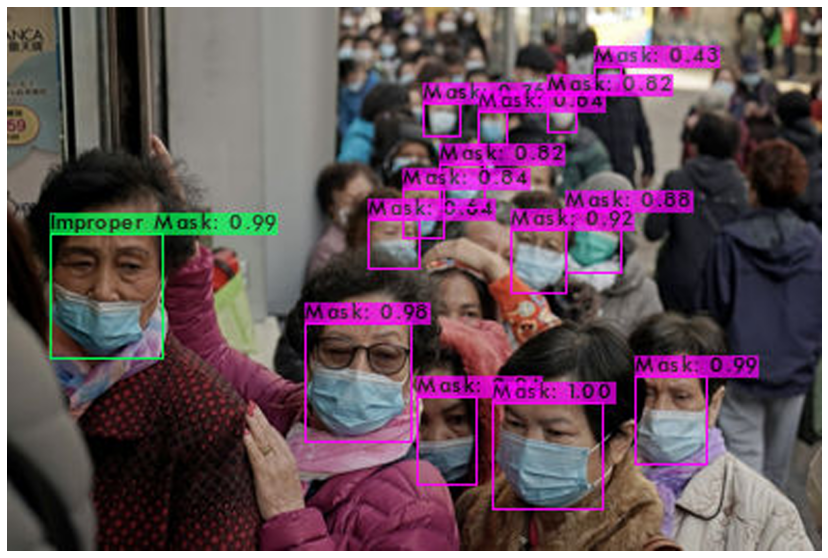

In [ ]:
imShow('drive/My Drive/Face Mask Detection/darknet/predictions_maksssksksss11.jpg')